自从人工智能开始火热以来，不断涌现出让人们惊叹的新技术。其中，基于Diffusion的技术突破层出不穷，每一次进展都给人们带来新的震撼。无论是Stable Diffusion、DALL·E 2，还是最近风靡的Sora，都离不开Diffusion的贡献。本教程将从经典的DDPM开始，结合代码和数学推导，一直探讨到最近的SOTA，带领您深入了解这一领域。



注：
假设读者知道[贝叶斯定理](https://)，以及有高等数学基础。


## 1. 基于直觉的理解



首先，我们要理解为什么要叫做“扩散”模型，以及为什么他的生成效果和稳定性都比其他生成模型优秀。

这里引用一下谭旭老师的[文章](https://zhuanlan.zhihu.com/p/591881660)。正如图中所示，我们把从Z到X的过程当作数据的生成过程。Diffusion从河右岸过来的航线不是可学习的，而是人工设计的，能保证到达河左岸的码头位置，虽然有些随机性，但是符合一个先验分布（一般是高斯分布），这样方便我们在生成数据的时候选择左岸出发的码头位置。因为训练模型的时候要求我们一步步打卡来时经过的浮标，在生成数据的时候，基本上也能遵守这些潜在的浮标位置，一步步打卡到达右岸码头。

这样一步一个脚印的方式极大地提高了生成过程中的稳定性和准确性，其他的生成方式例如GAN就如同训练一个神射手，其精准度和稳定性不言而喻。但是，凡事都有代价，Diffusion的代价就是生成（采样）速度慢，于是近些年很多研究者针对DIffusion采样慢的问题做了很多工作，最经典的例如DDIM，将会在下一篇文章中讲到。






![alt](https://picx.zhimg.com/70/v2-4e5411a439dc1153aef771e7de61e466_1440w.avis?source=172ae18b&biz_tag=Post)



我们将这一过程放大，得到下面这一过程，其中$x_{T}$表示符合正态分布的初始噪音，$x_{0}$表示我们需要的真实图像，$p_{\theta } (x_{t-1}|x_{t} )$表示生成（采样/降噪）过程，$q(x_{t}|x_{t-1} )$表示训练（增噪）过程。

 $p_{\theta } (x_{t-1}|x_{t} )$中的$\theta$表示这个过程涉及到模型中的参数，结果是由模型估计的。$q(x_{t}|x_{t-1} )$这一过程不涉及模型。$x_{T}$这一初始噪音为什么要符合正态分布，这一问题会在下文中得到解决。这里的$p$和$q$只是为了将分布区分开，都表示分布，并没有实质区别。

![alt](https://bohrium.oss-cn-zhangjiakou.aliyuncs.com/article/27689/5c9c062e67654f458b23a10f46eee79c/35f8135f-b917-4af0-882f-e34b3842e3a7.png)




## 2. 数学公式推导

首先，我们需要知道高斯分布的一些基础知识。

一个均值为$\mu$方差为$\sigma$的高斯分布的概率分布函数为:

$f(x)=\frac{1}{\sqrt{2\pi\sigma} }exp(-\frac{(x-\mu)^{2}} {2\mu^{2}})$ --------------------------------------------------------------------------------（1）



同时，高斯分布有可加性，即：

$X+Y\sim N(\mu (x)+\mu (y),\sigma^{2} (x)+\sigma^{2} (y))$ ------------------------------------------------------------（2）

$X-Y\sim N(\mu (x)-\mu (y),\sigma^{2} (x)+\sigma^{2} (y))$ ------------------------------------------------------------（3）

以及：$aX+b\sim N(a\mu +b,(a\sigma )^{2})$ ----------------------------------------------------------------------（4）


### 2.1 加噪过程



首先，一个基本事实是DDPM将加噪过程定义为一个纯粹的[马尔可夫过程](https://baike.baidu.com/item/%E9%A9%AC%E5%B0%94%E5%8F%AF%E5%A4%AB%E8%BF%87%E7%A8%8B/2952385?fr=ge_ala)，即当前状态只取决于上一个状态，可描述为：

$q(x_{t}|x_{t-1}):=N(x_{t};\sqrt[]{\alpha _{t}}x_{t-1},(1-\alpha _{t})\mathbf{I}  )$ ---------------------------------------------------------------（5）

其中，$\alpha_{t}$由加噪程度$\beta_{t}=1-\alpha_{t}$定义，$\beta_{t}$随$t$的增大而增大（一般0.0001 -> 0.02），这是因为刚开始的加噪只需要一点点噪声就可以制造很有信息量的样本对供模型学习，随着训练的进行需要更多的噪声来突出与之前样本对的变化。另外，$\mathbf{I}$是一个单位矩阵。

利用高斯分布的性质（公式（4）），我们可以得到：

  $x_{t}=\sqrt[]{\alpha _{t}}x_{t-1}+\sqrt[]{(1-\alpha_{t})z_{t}}$   -------------------------------------------------------------------------------(6)
  
  其中$z_{t} \sim N(0,\mathbf{I})$。

让我们接着（6）往下推：

$x_{t-1}=\sqrt[]{\alpha _{t-1}}x_{t1·-1}+\sqrt[]{(1-\alpha_{t})z_{t}}$  -----------------------------------------------------------------------
 (7)

 这个时候我们需要用到高中学到的数学归纳法，将（7）代入（6）得到：
 
 $x_{t}=\sqrt[]{\alpha _{t}} (\sqrt[]{\alpha _{t-1}x_{t-2}}x_{t-2}+\sqrt[]{1-\alpha _{t-1}}z_{t-1}  )+\sqrt[]{1-\alpha _{t}}z_{t}$

 化简：
 
  $x_{t}=\sqrt[]{\alpha _{t}\alpha _{t-1}} x_{t-2}+(\sqrt[]{\alpha _{t}(1-\alpha _{t-1})}z_{t-1}+\sqrt[]{1-\alpha _{t}}z_{t})$ ---------------------------------------------（8）

  再由高斯分布的可加性（公式（2））：
  
  

$\sqrt[]{\alpha _{t}(1-\alpha _{t-1})}z_{t-1}+\sqrt[]{1-\alpha _{t}}z_{t}\sim N(0,\alpha _{t}(1-\alpha _{t-1})+1-\alpha_{t})=N(0,1-\alpha_{t}\alpha_{t-1})$--------（9）

最后式（8）可以改写为：

 $x_{t}=\sqrt[]{\alpha _{t}\alpha _{t-1}} x_{t-2}+\sqrt[]{1-\alpha_{t}\alpha_{t-1}}\overline{z}_{t-2}$------------------------------------------------------------------（10）

 通过递推，我们显然可以得到：

  $x_{t}=\sqrt[]{\alpha_{t}\alpha_{t-1}...\alpha_{1}}x_{0}+\sqrt[]{1-\alpha_{t}\alpha_{t-1}...\alpha _{1}}\overline{z}_{0}$------------------------------------------------------------（11）

到此，我们可以看出很多信息，之所以把加噪过程设计成式（5）的数学样式，在我看来是为了达到最终式（11）的结果。

由于$0<\alpha<1$，T足够大，因此$\sqrt[]{\alpha_{t}\alpha_{t-1}...\alpha_{1}}\to 0$, $\sqrt[]{1-\alpha_{t}\alpha_{t-1}...\alpha _{1}}\to 1$。

进一步可以得到，$x_{T}\sim N(0,\mathbf{I})$。

终于，小船从真实分布出发，到达了名为高斯分布的彼岸，接下来我们需要初始化一个高斯分布，顺着路上我们设立的浮标，回到真实分布。

### 2.2 去噪过程

那我们该怎么回去呢，这个时候我们就得借助模型，让模型告诉我们怎样找到浮标。

去噪过程实际上就是求$p(x_{t-1}|x_{t})$，考虑能不能利用上加噪过程中的信息，这个时候我们自然而然想到贝叶斯定理。

$p(x_{t-1}|x_{t})=\frac{p(x_{t}|x_{t-1})p(x_{t-1})}{p(x_{t})}$-------------------------------------------------------------------------------(12)

式（12）中还是有很多变量不知道（当然不知道，如果知道直接数学方法就推过去了，还要模型干嘛），于是我们引入加噪过程中的信息，引入$x_{0}$。

$p(x_{t-1}|x_{t},x_{0})=\frac{p(x_{t}|x_{t-1},x_{0})p(x_{t-1}|x_{0})}{p(x_{t}|x_{0})}$---------------------------------------------------------------------(13)

这是真实的预测公式，这个时候已经可以看出来等式的右边均已知且符合高斯分布。

我们可以进一步推导，看看到底有没有解：

首先，我们将式（1）展开，得到：

$f(x)=\frac{1}{\sqrt{2\pi }\sigma  }exp[-\frac{1}{2}(\frac{1}{\sigma ^{2}}x^{2}-\frac{2\mu }{\sigma^{2} }x+\frac{\mu ^{2}}{\sigma{^{2}} } )]$-------------------------------------------------------------(14)

接着使用式（14）展开化简式（13）：


**(将$\alpha_{t}\alpha_{t-1}...\alpha_{1}$记为$\overline{\alpha}_{t}$)**


$p(x_{t-1}|x_{t},x_{0})=\frac{N(x_{t};\sqrt[]{\alpha_{t}}x_{t-1},(1-\alpha _{t})\mathbf{I})N(x_{t-1};\sqrt[]{\overline{\alpha} _{t-1}}x_{0},(1-\overline{\alpha} _{t-1})\mathbf{I})}{N(x_{t};\sqrt[]{\overline{\alpha} _{t}}x_{0},(1-\overline{\alpha} _{t})\mathbf{I})}$-----------------------------------------（15）

$p(x_{t-1}|x_{t},x_{0})\propto \frac{exp(-\frac{(x_{t}-\sqrt[]{\alpha _{t}}x_{t-1} )^{2}}{2(1-\alpha _{t})} )exp(-\frac{(x_{t-1}-\sqrt[]{\overline{\alpha} _{t-1}}x_{0} )^{2}}{2(1-\overline{\alpha} _{t-1})} )}{exp(-\frac{(x_{t}-\sqrt[]{\overline{\alpha} _{t}}x_{0} )^{2}}{2(1-\overline{\alpha} _{t})} )}$--------------------------------------------------(16)

$p(x_{t-1}|x_{t},x_{0})\propto exp[-\frac{1}{2}((\frac{\alpha _{t}}{1-\alpha _{t}}+\frac{1}{1-\overline{\alpha} _{t-1}}  )x^{2}_{t-1})-(\frac{2\sqrt[]{\overline{\alpha _{t}} } }{1-\alpha _{t}}x_{t}+\frac{2\sqrt[]{\overline{\alpha} _{t-1} } }{1-\overline{\alpha} _{t-1}}x_{0} )x_{t-1}+C(x_{t},x_{0}) ]$---(17
)

注：$p(x_{t}|x_{t-1},x_{0})=p(x_{t}|x_{t-1})$是因为
基于马尔科夫假设。

对比式（14）和式（17），比较$x^{2}$和$x$的系数,可以求得：

$\sigma ^{2}=\frac{1-\overline{\alpha }_{t-1}}{1-\overline{\alpha }_{t}} (1-\alpha _{t})$-------------------------------------------------------------------------------------(18)

$\mu = \frac{\sqrt[]{\alpha _{t}}(1-\overline{\alpha }_{t-1}) }{1-\overline{\alpha }_{t}}x_{t}+\frac{\sqrt[]{\overline{\alpha }_{t-1}}(1-\alpha _{t}) }{1-\overline{\alpha }_{t}}x_{0}$----------------------------------------------------------------------(19)

于是，我们得到了真实分布：

$p(x_{t-1}|x_{t},x_{0})=N(x_{t-1};\frac{\sqrt[]{\alpha _{t}}(1-\overline{\alpha }_{t-1}) }{1-\overline{\alpha }_{t}}x_{t}+\frac{\sqrt[]{\overline{\alpha }_{t-1}}(1-\alpha _{t}) }{1-\overline{\alpha }_{t}}x_{0},\frac{1-\overline{\alpha }_{t-1}}{1-\overline{\alpha }_{t}} (1-\alpha _{t})\mathbf{I})$-----------------------(20)

通过观察真实分布我们可以发现，方差是一个通过计算就能够得出来的量，如果我们想要让模型去尽可能地接近真实分布，只需要利用模型去对齐均值$\mu$,即：

$argmin_{\theta}||\mu(x_{0},x_{t}),\mu_{\theta}(x_{t},t)||$-----------------------------------------------------------------------（21）

观察式（19）可以发现，要想对齐均值，只需要利用模型给定$x_{t},t$来预测$x_{0}$即可（这正是加噪过程中创造的大量数据对），这样做确实可以，但是需要很大的算力，DDPM的作者采用了一种方法，让预测原图$x_{0}$转换成预测噪声$\epsilon_{\theta}(x_{t},t)$，神经网络模型似乎天生比较擅长预测残差。

联想到$x_{t}$、$t$、$x_{0}$之间存在着联系，将式（11）变形：

$x_{0}=\frac{1}{\sqrt[]{\overline{\alpha } }_{t} }(x_{t}-\sqrt[]{1-\overline{\alpha }_{t} }\overline{z }_{0} )$------------------------------------------------------------------------------(22)

将式（22）带入式（19）：

$\mu=\frac{1}{\sqrt[]{\alpha_{t}}}x_{t}-\frac{1-\alpha_{t}}{\sqrt[]{\alpha_{t}}\sqrt[]{1-\overline{\alpha}_{t}}}\overline{z}_{0}$---------------------------------------------------------------------------------(23)

模型就由预测$x_{0}$转换成预测$\overline{z }_{0}$，利用模型给定$x_{t},t$来预测$\overline{z }_{0}$。

$\overline{z }_{0}$表示由公式推导从$x_{0}$加噪到$x_{t}$的标准高斯分布，也就是说模型预测的是噪声$f_{\theta}(x_{t},t)=\epsilon_{\theta}(x_{t},t)\simeq\overline{z }_{0}$。





## 3. 设计模型

### 3.1 训练过程

由式（21）可知，我们需要的是在所有时刻，真实加入的噪音与模型预测的噪音差距越小越好，可以使用MSE来作为loss。

既然是所有时刻，只需要在训练时随机一个时间，再随机一个噪音，利用公式（11）得到$x_{t}$。这样我们获得了模型所需要的所有输入和标签。这里附一张原论文的算法图。

![alt](https://bohrium.oss-cn-zhangjiakou.aliyuncs.com/article/27689/a34d056746d149efa51176f8d0419761/72535698-db71-479f-ac10-817148ce9fca.png)

注意：torch.randn函数生成的随机数使用了标准正态分布作为随机数生成的基础分布。

### 3.2 采样过程

现在，我们已经可以通过模型得到预测的噪音，就可以通过式（23）得到的$p(x_{t-1}|x_{t})$的均值$\mu$,它非常贴近真实分布$p(x_{t-1}|x_{t},x_{0})$。

在下文的实例中，直接将均值加上一个随机噪音作为一个简单的采样点，毕竟在高斯分布中均值的概率是最高的。

## 4. 从代码理解

代码来自[此处](https://github.com/Ryota-Kawamura/How-Diffusion-Models-Work)，我做了注解，帮助读者理解模型。

### 4.1 准备工作

In [1]:
#导入必须的包
import torch
import torch.nn as nn
import numpy as np
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import os
import torch.nn.functional as F
from tqdm import tqdm
import torchvision.transforms as transforms
from torch.utils.data import DataLoader,Dataset
from PIL import Image
from IPython.display import HTML

早期的Diffusion采用Unet为架构，现在有DiT这样的使用Transformer代替Unet的模型。模型的意义只是为了预测噪音，所以为了方便演示，这里使用Unet。

In [2]:
class ResidualConvBlock(nn.Module):
    def __init__(
        self, in_channels: int, out_channels: int, is_res: bool = False
    ) -> None:
        super().__init__()

        # 检查输入和输出的通道数是否相同
        self.same_channels = in_channels == out_channels

        # 是否使用残差连接
        self.is_res = is_res

        # 第一层卷积层
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),   # 3x3 卷积核 步长：1 填充：1
            nn.BatchNorm2d(out_channels),   # Batch normalization
            nn.GELU(),   # Gelu激活函数，一种将RELU与dropout思想结合的激活函数，实验证明效果优于Relu
        )

        # 第二层卷积层
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),   # 3x3 卷积核 步长：1 填充：1
            nn.BatchNorm2d(out_channels),   # Batch normalization
            nn.GELU(),   # Gelu激活函数
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:

        # 如果使用残差连接
        if self.is_res:
            # 使用第一层卷积
            x1 = self.conv1(x)

            # 使用第二层卷积
            x2 = self.conv2(x1)

            # 如果输入输出通道数相同，将残差直接相加
            if self.same_channels:
                out = x + x2
            else:
                # 如果不相同 使用一个 1x1 卷积层在残差连接之前匹配通道数
                shortcut = nn.Conv2d(x.shape[1], x2.shape[1], kernel_size=1, stride=1, padding=0).to(x.device)
                out = shortcut(x) + x2
            #print(f"resconv forward: x {x.shape}, x1 {x1.shape}, x2 {x2.shape}, out {out.shape}")

            # 对输出进行归一化处理，将输出的均值归一化到接近于 1，以避免梯度爆炸或梯度消失的问题。这种归一化处理有助于提高网络的稳定性和训练效果。
            return out / 1.414

        # 如果不使用残差连接，直接输出第二层卷积层的输出
        else:
            x1 = self.conv1(x)
            x2 = self.conv2(x1)
            return x2

    # 获取输出通道数的方法
    def get_out_channels(self):
        return self.conv2[0].out_channels

    # 设置输出通道数的方法
    def set_out_channels(self, out_channels):
        self.conv1[0].out_channels = out_channels
        self.conv2[0].in_channels = out_channels
        self.conv2[0].out_channels = out_channels


# 构造Unet的上采样过程
class UnetUp(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetUp, self).__init__()

        # 这个过程主要包含一个用于上采样的反卷积层，后接两个残差卷积块
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, 2, 2),
            ResidualConvBlock(out_channels, out_channels),
            ResidualConvBlock(out_channels, out_channels),
        ]

        # 使用这些层构建一个Sequential Model
        self.model = nn.Sequential(*layers)

    def forward(self, x, skip):
        # 将输入张量和残差张量拼接到一起，这时候通道数相加
        x = torch.cat((x, skip), 1)

        # 将拼接起来的张量注入模型，返回输出
        x = self.model(x)
        return x


# 构建Unet的下采样过程
class UnetDown(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetDown, self).__init__()

        # 这个过程主要包含残差卷积块，后接一个用于下采样的Pool层
        layers = [ResidualConvBlock(in_channels, out_channels), ResidualConvBlock(out_channels, out_channels),
                  nn.MaxPool2d(2)]

        # 使用这些层构建一个Sequential Model
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        # 将输入的张量注入模型，返回输出
        return self.model(x)

In [3]:
# 构建Diffusion中很重要的Embedding过程，用于embed时间步，以及后面部分可能出现的条件embed。
class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        '''
        这个class定义了一个通用的单层前馈神经网络，用于将维度 input_dim 的输入数据嵌入到维度 emb_dim 的嵌入空间。
        '''
        self.input_dim = input_dim

        # 定义用于这个网络的层
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
        ]

        # 使用上述的层构建一个sequential model
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        # 将输入按照input_dim展开
        x = x.view(-1, self.input_dim)
        # 将展开的模型应用到模型
        return self.model(x)

In [4]:
# 构建自定义数据集
class CustomDataset(Dataset):
    def __init__(self, sfilename, lfilename, transform, null_context=False):
        self.sprites = np.load(sfilename)
        self.slabels = np.load(lfilename)
        print(f"sprite shape: {self.sprites.shape}")
        print(f"labels shape: {self.slabels.shape}")
        self.transform = transform
        self.null_context = null_context
        self.sprites_shape = self.sprites.shape
        self.slabel_shape = self.slabels.shape

    # 返回数据集中有多少张图（必要）
    def __len__(self):
        return len(self.sprites)

    # 在给定的idx下获取图片和标签（必要）
    def __getitem__(self, idx):
        # 将图片和标签作为一个元组返回
        if self.transform:
            image = self.transform(self.sprites[idx])
            if self.null_context:
                label = torch.tensor(0).to(torch.int64)
            else:
                label = torch.tensor(self.slabels[idx]).to(torch.int64)
        return (image, label)

    def getshapes(self):
        # 返回图片和标签的shape
        return self.sprites_shape, self.slabel_shape

In [5]:
# 对CustomDataset中的数据进行预处理
transform = transforms.Compose([
    transforms.ToTensor(),
    # 将图像转换为 PyTorch 的张量格式，并将像素值从整数范围 [0, 255] 映射到浮点数范围 [0.0, 1.0]。
    transforms.Normalize((0.5,), (0.5,))
    # 对张量进行标准化操作，将张量的每个通道归一化到均值为 0.5，标准差为 0.5 的范围内，从而将像素值范围从 [0.0, 1.0] 映射到 [-1.0, 1.0]。
])

In [6]:
def unorm(x):
    # unity norm. results in range of [0,1]
    # assume x (h,w,3)
    xmax = x.max((0,1))
    xmin = x.min((0,1))
    return(x - xmin)/(xmax - xmin)

def norm_all(store, n_t, n_s):
    # runs unity norm on all timesteps of all samples
    nstore = np.zeros_like(store)
    for t in range(n_t):
        for s in range(n_s):
            nstore[t,s] = unorm(store[t,s])
    return nstore

def norm_torch(x_all):
    # runs unity norm on all timesteps of all samples
    # input is (n_samples, 3,h,w), the torch image format
    x = x_all.cpu().numpy()
    xmax = x.max((2,3))
    xmin = x.min((2,3))
    xmax = np.expand_dims(xmax,(2,3)) 
    xmin = np.expand_dims(xmin,(2,3))
    nstore = (x - xmin)/(xmax - xmin)
    return torch.from_numpy(nstore)

#画图工具函数

def plot_grid(x,n_sample,n_rows,save_dir,w):
    # x:(n_sample, 3, h, w)
    ncols = n_sample//n_rows
    grid = make_grid(norm_torch(x), nrow=ncols)  # curiously, nrow is number of columns.. or number of items in the row.
    save_image(grid, save_dir + f"run_image_w{w}.png")
    print('saved image at ' + save_dir + f"run_image_w{w}.png")
    return grid

def plot_sample(x_gen_store,n_sample,nrows,save_dir, fn,  w, save=False):
    ncols = n_sample//nrows
    sx_gen_store = np.moveaxis(x_gen_store,2,4)                               # change to Numpy image format (h,w,channels) vs (channels,h,w)
    nsx_gen_store = norm_all(sx_gen_store, sx_gen_store.shape[0], n_sample)   # unity norm to put in range [0,1] for np.imshow
    
    # create gif of images evolving over time, based on x_gen_store
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True,figsize=(ncols,nrows))
    def animate_diff(i, store):
        print(f'gif animating frame {i} of {store.shape[0]}', end='\r')
        plots = []
        for row in range(nrows):
            for col in range(ncols):
                axs[row, col].clear()
                axs[row, col].set_xticks([])
                axs[row, col].set_yticks([])
                plots.append(axs[row, col].imshow(store[i,(row*ncols)+col]))
        return plots
    ani = FuncAnimation(fig, animate_diff, fargs=[nsx_gen_store],  interval=200, blit=False, repeat=True, frames=nsx_gen_store.shape[0]) 
    plt.close()
    if save:
        ani.save(save_dir + f"{fn}_w{w}.gif", dpi=100, writer=PillowWriter(fps=5))
        print('saved gif at ' + save_dir + f"{fn}_w{w}.gif")
    return ani

### 4.2 Unet主体

注意：DDPM不包含条件生成，这里的context是用于介绍后面的条件生成部分。

In [7]:
# 定义Unet主体
class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat=64, n_cfeat=10, height=16):  # 默认参数，定义模型时可修改
        super(ContextUnet, self).__init__()

        self.in_channels = in_channels # 输入的通道数
        self.n_feat = n_feat    # 中间层的通道数，也是特征图的数量
        self.n_cfeat = n_cfeat  # 文本标签的数量，在条件生成中使模型生成我们想要的图片
        self.h = height  #假设 h == w. 由于经过两次下采样，必须能被 4 整除, 由于数据长宽为16，取16...

        # 初始化初始卷积层，(3,16,16)-->(64,16,16)
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # 初始化Unet的两次下采样过程
        self.down1 = UnetDown(n_feat, n_feat)        # down1 (64,16,16)-->(64,8,8)
        self.down2 = UnetDown(n_feat, 2 * n_feat)    # down2 (64,8,8)-->(128,4,4)
        
         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        # 使用一层全连接网络嵌入时间步和文本标签
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

        # 初始化Unet的三次上采样过程
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4), # up-sample 
            nn.GroupNorm(8, 2 * n_feat), # normalize                        
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # 初始化最终的卷积层以映射到与输入图像相同数量的通道
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), # 减少特征图的数量   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_feat), # Group norm对batch-size不敏感
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), # 映射到与输入图像相同数量的通道
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_feat, h, w) : 图片输入
        t : (batch, n_cfeat)      : 时间步
        c : (batch, n_classes)    : 文本标签
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on

        # 输入通过初始卷积层
        x = self.init_conv(x)       #[100,3,16,16]-->[100,64,16,16]
        # 将结果输入到下采样卷积层
        down1 = self.down1(x)       #[100,64,16,16]-->[100,64,8,8]
        down2 = self.down2(down1)   #[100,64,8,8]-->[100,128,4,4]
        
        # 将特征图转换为向量并激活
        hiddenvec = self.to_vec(down2)      #[100,128,4,4]-->[100,128,1,1]
        
        # 如果 context_mask == 1，则屏蔽 context
        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x)
            
        # 嵌入文本和时间步
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)     # (batch, 2*n_feat, 1,1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)
        #print(f"uunet forward: cemb1 {cemb1.shape}. temb1 {temb1.shape}, cemb2 {cemb2.shape}. temb2 {temb2.shape}")


        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1 + temb1, down2)  # add and multiply embeddings
        up3 = self.up2(cemb2*up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out

### 4.3 构建模型

In [8]:
# hyperparameters

# diffusion hyperparameters
timesteps = 500
beta1 = 1e-4
beta2 = 0.02

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
n_feat = 64 # 64 hidden dimension feature
n_cfeat = 5 # context vector is of size 5
height = 16 # 16x16 图片
save_dir = './weights/' # 模型将会保存在这个位置

# training hyperparameters
batch_size = 100
n_epoch = 32
lrate=1e-3

In [9]:
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
# b_t时一个在 [beta1, beta2] 范围内线性变化的系数序列 
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()   # ab_t表示所有a_t相乘   
ab_t[0] = 1

In [10]:
# 构造模型
nn_model = ContextUnet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

In [11]:
# 加载数据集和构建优化器
dataset = CustomDataset("/bohr/sprites-fbeg/v1/sprites_1788_16x16.npy", "/bohr/sprites-fbeg/v1/sprite_labels_nc_1788_16x16.npy", transform, null_context=False)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)

sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)


In [12]:
# 将图像扰动到指定的噪音水平，实现公式（11）
def perturb_input(x, t, noise):
    return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]) * noise

### 4.4 训练

In [13]:
# 训练不带条件控制的模型

# set into train mode
nn_model.train()

for ep in range(n_epoch):
    print(f'epoch {ep}')
    
    # linearly decay learning rate
    optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)
    
    pbar = tqdm(dataloader, mininterval=2 )
    for x, _ in pbar:   # x: images
        optim.zero_grad()
        x = x.to(device)
        
        # 生成噪音扰乱数据
        noise = torch.randn_like(x)
        t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device) 
        x_pert = perturb_input(x, t, noise)
        # 使用模型去预测噪声
        pred_noise = nn_model(x_pert, t / timesteps)
        # loss 是预测的噪声和真实噪声之间的MSE
        loss = F.mse_loss(pred_noise, noise)
        loss.backward()
        
        optim.step()

    # 每过四个epoch保存一次模型
    if ep%4==0 or ep == int(n_epoch-1):
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        torch.save(nn_model.state_dict(), save_dir + f"model_{ep}.pth")
        print('saved model at ' + save_dir + f"model_{ep}.pth")

epoch 0
100%|██████████| 894/894 [00:25<00:00, 34.65it/s]
saved model at ./weights/model_0.pth
epoch 1
100%|██████████| 894/894 [00:21<00:00, 41.18it/s]
epoch 2
100%|██████████| 894/894 [00:21<00:00, 41.48it/s]
epoch 3
100%|██████████| 894/894 [00:21<00:00, 41.44it/s]
epoch 4
100%|██████████| 894/894 [00:21<00:00, 41.46it/s]
saved model at ./weights/model_4.pth
epoch 5
100%|██████████| 894/894 [00:21<00:00, 41.55it/s]
epoch 6
100%|██████████| 894/894 [00:22<00:00, 40.06it/s]
epoch 7
100%|██████████| 894/894 [00:21<00:00, 41.59it/s]
epoch 8
100%|██████████| 894/894 [00:21<00:00, 41.43it/s]
saved model at ./weights/model_8.pth
epoch 9
100%|██████████| 894/894 [00:22<00:00, 39.76it/s]
epoch 10
100%|██████████| 894/894 [00:21<00:00, 41.59it/s]
epoch 11
100%|██████████| 894/894 [00:21<00:00, 41.59it/s]
epoch 12
100%|██████████| 894/894 [00:21<00:00, 41.45it/s]
saved model at ./weights/model_12.pth
epoch 13
100%|██████████| 894/894 [00:21<00:00, 41.33it/s]
epoch 14
100%|██████████| 894/894 [

### 4.5 采样

In [14]:
# 减去预测的噪声（但添加一些噪声以避免崩溃）
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)
    noise = b_t.sqrt()[t] * z
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()
    return mean + noise

In [15]:
@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20):
    # x_T ~ N(0, 1), 初始化为噪音
    samples = torch.randn(n_sample, 3, height, height).to(device)  

    # 数组来保存生成的过程
    intermediate = [] 
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # 采样一些随机噪声注回。对于 i = 1，不要添加噪声
        z = torch.randn_like(samples) if i > 1 else 0

        eps = nn_model(samples, t)    # 预测噪声
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate ==0 or i==timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

 **观察 Epoch 0 采样**

In [16]:
nn_model.load_state_dict(torch.load(f"{save_dir}/model_0.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [17]:
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

**观察 Epoch 4 采样**

In [18]:
nn_model.load_state_dict(torch.load(f"{save_dir}/model_4.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [19]:
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

**观察 Epoch 8 采样**

In [20]:
nn_model.load_state_dict(torch.load(f"{save_dir}/model_8.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [21]:
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

**观察 Epoch 16 采样**

In [22]:
nn_model.load_state_dict(torch.load(f"{save_dir}/model_16.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [23]:
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

**观察 Epoch 32 采样**

In [24]:
nn_model.load_state_dict(torch.load(f"{save_dir}/model_31.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [25]:
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

# 基本技能

python 
- 虚拟环境 conda activate your_env_name,为什么需要虚拟环境
    - 如何安装库 pip install,conda install
- 常用的组合
    - Anaconda 解释器+包管理工具conda + VScode 编辑器
    - Anaconda 解释器+包管理工具conda + Pycharm 编辑器  
    
linux 
- 常见的命令 cd,ls,pwd,rm,cp等等

代码
- 掌握pytorch
- 复现github代码
    - 下载代码，git命令，git clone等，如果有进大厂的想法还是要学一下
    - 学会看readme.md
    - 配置环境，分清cpu还是gpu,nvidia-smi
    - 如何看代码，一般从main.py最后往前看
        - 输入是什么，维度变化情况，loss是什么，输出是什么
        - 模型就是一个黑箱，可以先不用细看，但是他的作用是什么
    - terminal中运行python xxx.py在做什么，sh文件是啥，bash xxx.sh在做什么
    
写代码如何高效
- 分块
    - 数据导入与预处理，模型，训练，验证，测试
    - 有分块的思想

# 资料

b站是个好东西

- 李沐，B站有经典论文讲解和深度学习课程
- 李宏毅，课程很紧跟时代，包括LLM,扩散模型

必备知识点
- Transformer
    - 什么是自注意力机制，Q,K,V分别的作用
    - 什么是位置编码，为什么需要位置编码
    - 什么是层归一化，Layer Normation和batch Normation的区别，Post Norm和Pre Norm的区别，哪个在CV上使用，哪个在NLP上使用
    - resnet的用处，为了解决什么问题
- CNN  
    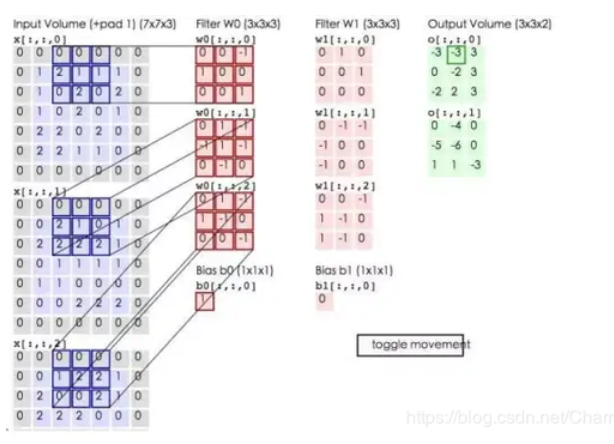
- Unet
等等。。。